# Банковская просрочка по кредиту

Датасет содержит информацию о клиентах некоторого банка.  
Ваша задача состоит в том, чтобы по различным характеристикам клиентов спрогнозировать целевую переменную - имел клиент просрочку 90 и более дней или нет (и если имел, то банк не будет выдавать кредит этому клиенту, а иначе будет)

In [1]:
from typing import List

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
RANDOM_STATE = 42

In [3]:
DATASET_PATH = "https://raw.githubusercontent.com/evgpat/edu_stepik_from_idea_to_mvp/main/datasets/credit_scoring.csv"

## Загрузка и обзор данных

### Загрузка

In [200]:
# загрузка данных
df = pd.read_csv(DATASET_PATH)

### Описание данных

**Целевая переменная**
- `SeriousDlqin2yrs`: клиент имел просрочку 90 и более дней

**Признаки**
- `RevolvingUtilizationOfUnsecuredLines`: общий баланс средств / сумма кредитных лимитов (total balance on credit cards and personal lines of credit except real estate and no installment debt
like car loans divided by the sum of credit limits)
- `age`: возраст заемщика
- `NumberOfTime30-59DaysPastDueNotWorse`: сколько раз за последние 2 года наблюдалась просрочка 30-59 дней
- `DebtRatio`: ежемесячные расходы (платеж по долгам, алиментам, расходы на проживания) деленные на месячный доход
- `MonthlyIncome`: ежемесячный доход
- `NumberOfOpenCreditLinesAndLoans`: количество открытых кредитов (напрмер, автокредит или ипотека) и кредитных карт
- `NumberOfTimes90DaysLate`: сколько раз наблюдалась просрочка (90 и более дней)
- `RealEstateLoansOrLines`: закодированное количество кредиов (в том числе под залог жилья) - чем больше код буквы, тем больше кредитов
- `NumberOfTime60-89DaysPastDueNotWorse`: сколько раз за последние 2 года заемщик задержал платеж на 60-89 дней
- `NumberOfDependents`: количество иждивенцев на попечении (супруги, дети и др)
- `GroupAge`: закодированная возрастная группа - чем больше код, тем больше возраст

In [5]:
target = ['SeriousDlqin2yrs']
cat_features = ['RealEstateLoansOrLines', 'GroupAge']
num_features = list(set(df.columns.to_list())- set(target) -set(cat_features))

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 12 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   SeriousDlqin2yrs                      150000 non-null  int64  
 1   RevolvingUtilizationOfUnsecuredLines  150000 non-null  float64
 2   age                                   135155 non-null  float64
 3   NumberOfTime30-59DaysPastDueNotWorse  150000 non-null  int64  
 4   DebtRatio                             150000 non-null  float64
 5   MonthlyIncome                         120269 non-null  float64
 6   NumberOfOpenCreditLinesAndLoans       150000 non-null  int64  
 7   NumberOfTimes90DaysLate               150000 non-null  int64  
 8   NumberOfTime60-89DaysPastDueNotWorse  150000 non-null  int64  
 9   NumberOfDependents                    146076 non-null  float64
 10  RealEstateLoansOrLines                150000 non-null  object 
 11  

Столбцы `age`,`MonthlyIncome`, `NumberOfDependents` содержат пропуски

In [7]:
df.sample(5)

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RealEstateLoansOrLines,GroupAge
130838,0,0.035153,NaN,0,9123.000000,NaN,23,0,0,0.0,B,e
37789,0,0.221039,53.0,1,0.510889,5509.0,7,0,0,1.0,A,d
47668,0,0.388499,54.0,0,0.473450,4500.0,8,0,0,2.0,A,d
77403,0,0.000000,52.0,0,0.246175,10000.0,7,0,0,2.0,A,d
118801,0,0.508101,33.0,0,1436.000000,NaN,7,0,0,0.0,A,b


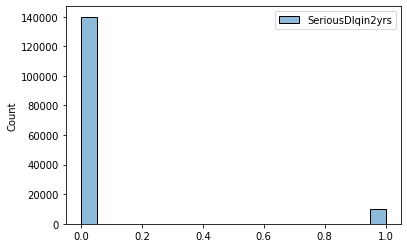

In [8]:
sns.histplot(df[target])
plt.show()

Виден сильный перекос в классах (нужно будет это учесть)

In [10]:
df[['NumberOfOpenCreditLinesAndLoans', 'DebtRatio', 'NumberOfTimes90DaysLate']].describe()

,NumberOfOpenCreditLinesAndLoans,DebtRatio,NumberOfTimes90DaysLate
count,150000.000000,150000.000000,150000.000000
mean,8.452760,353.005076,0.265973
std,5.145951,2037.818523,4.169304
min,0.000000,0.000000,0.000000
25%,5.000000,0.175074,0.000000
50%,8.000000,0.366508,0.000000
75%,11.000000,0.868254,0.000000
max,58.000000,329664.000000,98.000000


In [9]:
df[num_features].describe().style

,NumberOfTime60-89DaysPastDueNotWorse,NumberOfTime30-59DaysPastDueNotWorse,age,RevolvingUtilizationOfUnsecuredLines,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,MonthlyIncome,NumberOfDependents,DebtRatio
count,150000.000000,150000.000000,135155.000000,150000.000000,150000.000000,150000.000000,120269.000000,146076.000000,150000.000000
mean,0.240387,0.421033,52.293618,6.048438,8.452760,0.265973,6670.221237,0.757222,353.005076
std,4.155179,4.192781,14.772577,249.755371,5.145951,4.169304,14384.674215,1.115086,2037.818523
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,41.000000,0.029867,5.000000,0.000000,3400.000000,0.000000,0.175074
50%,0.000000,0.000000,52.000000,0.154181,8.000000,0.000000,5400.000000,0.000000,0.366508
75%,0.000000,0.000000,63.000000,0.559046,11.000000,0.000000,8249.000000,1.000000,0.868254
max,98.000000,98.000000,109.000000,50708.000000,58.000000,98.000000,3008750.000000,20.000000,329664.000000


#### Распределение по возрастным группам

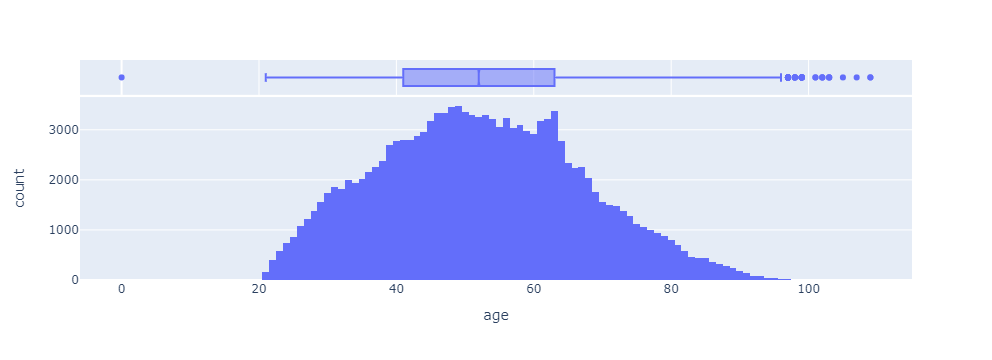

In [11]:
# fig = px.histogram(df, x="age")
# fig.show()

fig = px.histogram(df, x="age",
                   marginal="box")
fig.show()

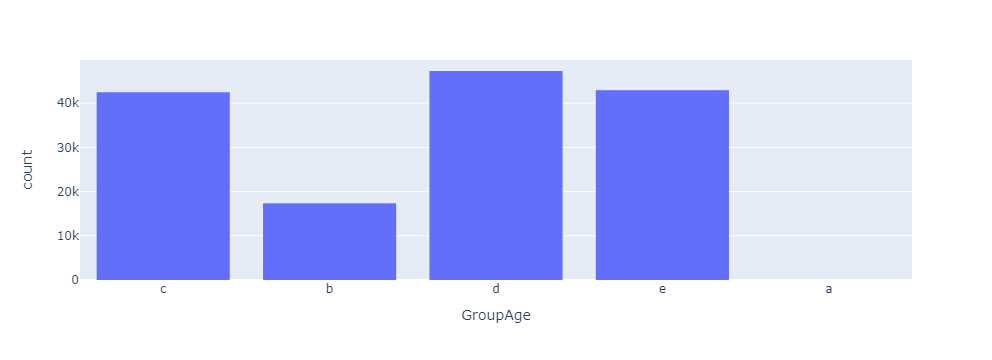

In [12]:
fig = px.histogram(df, x="GroupAge")
fig.show()

In [13]:
df['GroupAge'].value_counts()

d    47268
e    42930
c    42458
b    17343
a        1
Name: GroupAge, dtype: int64

Видим странный выброс в группе **a**.

In [14]:
df[df.GroupAge=='a']

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RealEstateLoansOrLines,GroupAge
41655,0,1.0,0.0,1,0.436927,6000.0,6,0,0,2.0,A,a


#### Посмотрим на пропуски

In [15]:
df[df.age.isna()]['GroupAge'].value_counts()

e    14845
Name: GroupAge, dtype: int64

<AxesSubplot: xlabel='age', ylabel='Count'>

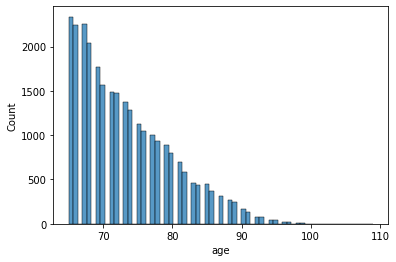

In [16]:
sns.histplot(df[df.GroupAge=='e']['age'])

#### Группы возрастов 

In [68]:
labels_GroupAge = []
for group in sorted(df['GroupAge'].unique()):
    df_group = df[df.GroupAge==group]
    print(f"{group}: {df_group['age'].min()}-{df_group['age'].max()}")
    labels_GroupAge.append(str(f"{df_group['age'].min()}-{df_group['age'].max()}"))

a: 0.0-0.0
b: 21.0-34.0
c: 35.0-49.0
d: 50.0-64.0
e: 65.0-109.0


Можно заполнить пропуски средним значением по группе **e** или выбрать случайно из Пуассона

#### Ежемесячные доходы и расходы

##### Заполнение пропусков в MonthlyIncome

In [176]:
df["MonthlyIncome"] = df[["MonthlyIncome", "GroupAge"]].groupby("GroupAge").transform(lambda x: x.fillna(x.median()))

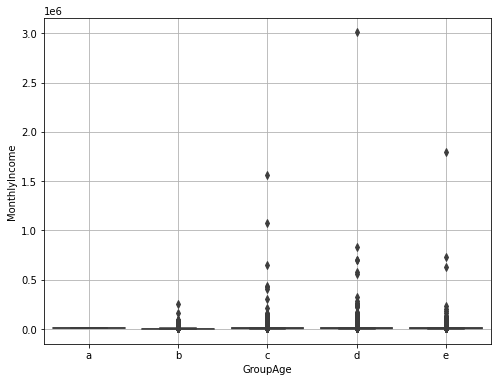

In [177]:
plt.figure(figsize=(8,6))
sns.boxplot(data=df.sort_values(by='GroupAge'), 
            x="GroupAge",
            y="MonthlyIncome", 
            # hue="GroupAge"
           )
plt.grid()

# fig = px.box(df, y="MonthlyIncome",
#              log_y=True,
#              color="GroupAge")
# fig.show()

In [142]:
df[["RevolvingUtilizationOfUnsecuredLines", 
    "DebtRatio", 
    "MonthlyIncome"]].describe()

,RevolvingUtilizationOfUnsecuredLines,DebtRatio,MonthlyIncome
count,150000.000000,150000.000000,1.500000e+05
mean,6.048438,353.005076,6.428677e+03
std,249.755371,2037.818523,1.289474e+04
min,0.000000,0.000000,0.000000e+00
25%,0.029867,0.175074,3.725000e+03
50%,0.154181,0.366508,5.500000e+03
75%,0.559046,0.868254,7.400000e+03
max,50708.000000,329664.000000,3.008750e+06


Видим сильные выбросы

Посчитаем квантили

In [143]:
quantiles = df[["RevolvingUtilizationOfUnsecuredLines", 
                "DebtRatio", 
                "MonthlyIncome", 
                "GroupAge"]].groupby(by="GroupAge").quantile(q=0.95)#.reset_index()

quantiles

,RevolvingUtilizationOfUnsecuredLines,DebtRatio,MonthlyIncome
GroupAge,,,
a,1.0,0.436927,6000.0
b,1.0,863.800000,8500.0
c,1.0,2560.000000,13334.9
d,1.0,2921.000000,15100.0
e,1.0,2193.000000,12700.0


In [178]:
def drop_outliers(df: pd.DataFrame, columns:List[str]) -> pd.DataFrame:
    "drop outliers from df"
    quantiles = df[columns+['GroupAge']].groupby(by="GroupAge").quantile(q=0.95)

    def is_not_outlier(s):
        res = True
        for col in columns:
            res = res and (s[col] <= quantiles.loc[s.GroupAge][col])
        return res

    return df[df.apply(is_not_outlier, axis=1)]

In [202]:
%%time
columns_with_outliers = ["RevolvingUtilizationOfUnsecuredLines", "DebtRatio", "MonthlyIncome"]
df_without_outliers = drop_outliers(df, columns_with_outliers)

print("before delete outliers", df.shape[0])
print("after delete outliers", df_without_outliers.shape[0])

before delete outliers 150000
after delete outliers 111192
Wall time: 25.5 s


In [203]:
df_without_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 111192 entries, 0 to 149998
Data columns (total 12 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   SeriousDlqin2yrs                      111192 non-null  int64  
 1   RevolvingUtilizationOfUnsecuredLines  111192 non-null  float64
 2   age                                   100213 non-null  float64
 3   NumberOfTime30-59DaysPastDueNotWorse  111192 non-null  int64  
 4   DebtRatio                             111192 non-null  float64
 5   MonthlyIncome                         111192 non-null  float64
 6   NumberOfOpenCreditLinesAndLoans       111192 non-null  int64  
 7   NumberOfTimes90DaysLate               111192 non-null  int64  
 8   NumberOfTime60-89DaysPastDueNotWorse  111192 non-null  int64  
 9   NumberOfDependents                    111192 non-null  float64
 10  RealEstateLoansOrLines                111192 non-null  object 
 11  

In [ ]:
df_without_outliers[["MonthlyIncome", "GroupAge"]].groupby("GroupAge").transform(lambda x: x.fillna(np.random.normal(loc=x.mean(), scale=x.std())))

df_without_outliers[["MonthlyIncome", "GroupAge"]].sample

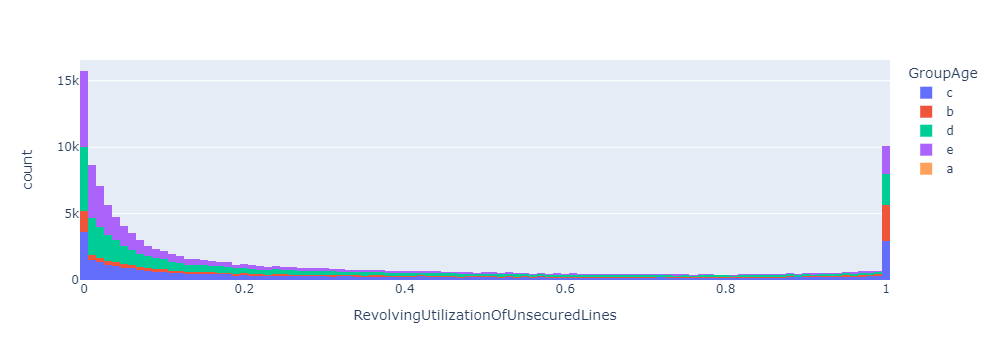

In [146]:
fig = px.histogram(df_without_outliers, 
                   x="RevolvingUtilizationOfUnsecuredLines",
                   color="GroupAge",
                   # log_y=True
                  )
fig.show()

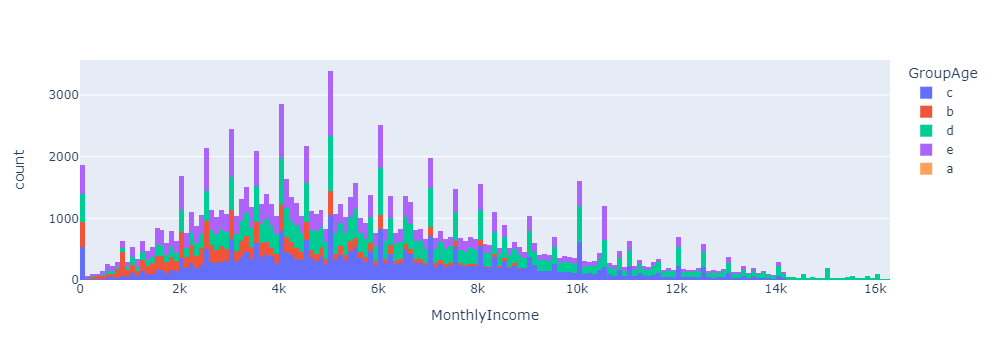

In [204]:
fig = px.histogram(df_without_outliers, 
                   x="MonthlyIncome",
                   color="GroupAge",
                   # log_y=True
                  )
fig.show()

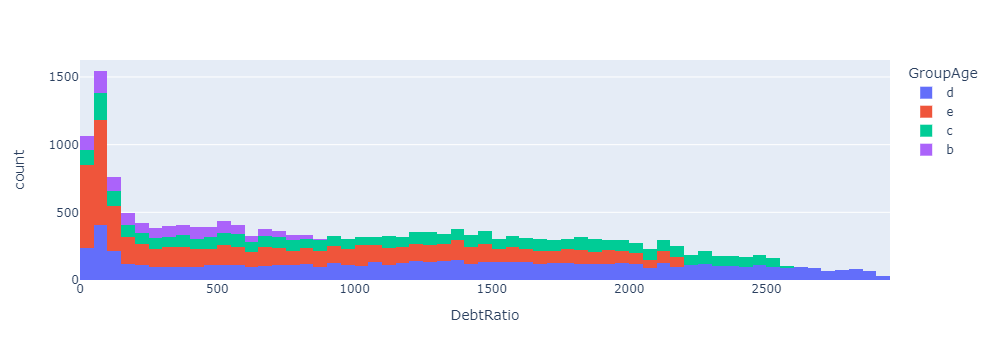

In [148]:
fig = px.histogram(df_without_outliers[df_without_outliers["DebtRatio"]>30], 
                   x="DebtRatio",
                   color="GroupAge",
                   # log_y=True
                  )
fig.show()

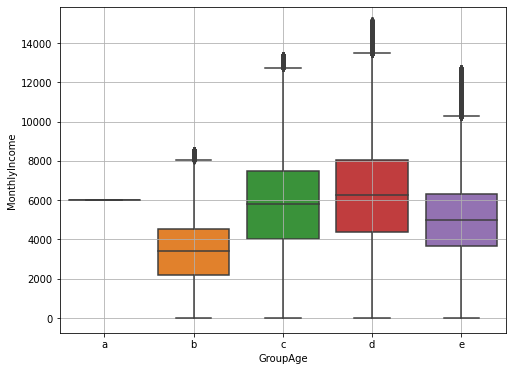

In [149]:
plt.figure(figsize=(8,6))
sns.boxplot(data=df_without_outliers.sort_values(by='GroupAge'), 
            x="GroupAge",
            y="MonthlyIncome", 
            # hue="GroupAge"
           )
plt.grid()

# plotly
# fig = px.box(df_without_outliers.sort_values(by='GroupAge'), 
#              y="MonthlyIncome",
#              # log_y=True,
#              color="GroupAge",
#             )
# fig.show()

#### Информация по кредитам

-`NumberOfTime30-59DaysPastDueNotWorse` : сколько раз за последние 2 года наблюдалась просрочка 30-59 дней

-`NumberOfTime60-89DaysPastDueNotWorse` : сколько раз за последние 2 года заемщик задержал платеж на 60-89 дней

-`NumberOfTimes90DaysLate` : сколько раз наблюдалась просрочка (90 и более дней)

-`NumberOfOpenCreditLinesAndLoans` : количество открытых кредитов (напрмер, автокредит или ипотека) и кредитных карт

In [83]:
df['NumberOfTime30-59DaysPastDueNotWorse'].value_counts().sort_index()

0     126018
1      16033
2       4598
3       1754
4        747
5        342
6        140
7         54
8         25
9         12
10         4
11         1
12         2
13         1
96         5
98       264
Name: NumberOfTime30-59DaysPastDueNotWorse, dtype: int64

In [84]:
df['NumberOfTime60-89DaysPastDueNotWorse'].value_counts().sort_index()

0     142396
1       5731
2       1118
3        318
4        105
5         34
6         16
7          9
8          2
9          1
11         1
96         5
98       264
Name: NumberOfTime60-89DaysPastDueNotWorse, dtype: int64

In [85]:
df['NumberOfTimes90DaysLate'].value_counts().sort_index()

0     141662
1       5243
2       1555
3        667
4        291
5        131
6         80
7         38
8         21
9         19
10         8
11         5
12         2
13         4
14         2
15         2
17         1
96         5
98       264
Name: NumberOfTimes90DaysLate, dtype: int64

Что за выбросы в районе 96/98?

In [97]:
df[df['NumberOfTimes90DaysLate']==98].sample(5)

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RealEstateLoansOrLines,GroupAge
140565,0,1.0,21.0,98,0.0,NaN,0,98,98,NaN,A,b
31984,0,1.0,22.0,98,69.0,NaN,0,98,98,0.0,A,b
61561,0,1.0,25.0,98,0.0,1.0,0,98,98,0.0,A,b
77749,0,1.0,25.0,98,0.0,3000.0,0,98,98,0.0,A,b
131847,0,1.0,21.0,98,0.0,0.0,0,98,98,0.0,A,b


##### Кол-во иждивенцев

In [99]:
df["NumberOfDependents"].value_counts().sort_index()

0.0     86902
1.0     26316
2.0     19522
3.0      9483
4.0      2862
5.0       746
6.0       158
7.0        51
8.0        24
9.0         5
10.0        5
13.0        1
20.0        1
Name: NumberOfDependents, dtype: int64

<AxesSubplot: xlabel='NumberOfDependents', ylabel='count'>

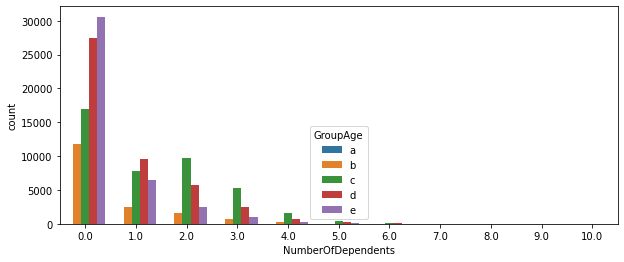

In [114]:
plt.figure(figsize=(10,4))
sns.countplot(x="NumberOfDependents", 
              data=df.loc[df["NumberOfDependents"] <= 10].sort_values(by='GroupAge'),
              hue="GroupAge")

# plotly
# fig = px.histogram(df_without_outliers, 
#                    x="NumberOfDependents",
#                    color="GroupAge",
#                    # log_y=True
#                   )
# fig.show()

In [120]:
df[df["NumberOfDependents"]>8]

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RealEstateLoansOrLines,GroupAge
11651,0,0.079194,60.0,0,0.133582,7500.0,10,0,0,10.0,A,d
15159,0,0.099401,58.0,0,3592.000000,NaN,14,0,0,9.0,A,d
18159,0,1.000000,38.0,0,0.643728,2789.0,5,0,0,9.0,A,c
66477,0,0.139466,43.0,1,3621.000000,0.0,9,0,0,10.0,A,c
85304,0,0.000000,44.0,0,0.035590,12896.0,5,0,0,10.0,A,c
105647,0,0.494849,37.0,0,0.268706,3300.0,9,1,0,9.0,A,c
106885,0,0.017858,47.0,1,0.368932,9166.0,7,0,0,10.0,A,c
107484,0,0.325828,39.0,0,0.027100,4833.0,6,0,0,10.0,A,c
111507,0,1.000000,53.0,1,0.230054,3333.0,3,1,0,13.0,A,d
125528,0,0.226616,NaN,1,0.576539,6316.0,11,2,0,20.0,A,e


Заметка: заёмщики с большим кол-вом иждивенцев стабильно выплачивают кредиты

##### Кол-во кредитов

In [125]:
df["RealEstateLoansOrLines"].value_counts()

A    140048
B      8470
C      1388
D        84
E        10
Name: RealEstateLoansOrLines, dtype: int64

<AxesSubplot: xlabel='NumberOfOpenCreditLinesAndLoans', ylabel='count'>

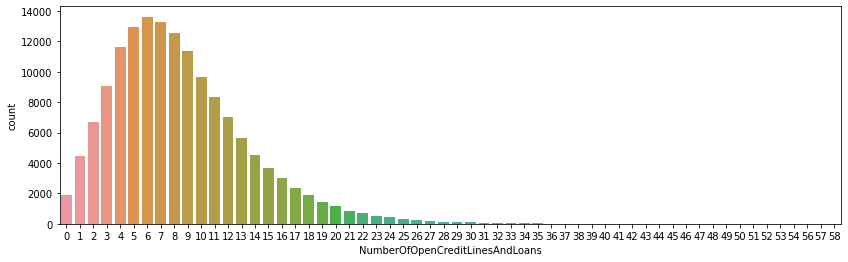

In [130]:
plt.figure(figsize=(14,4))
sns.countplot(x="NumberOfOpenCreditLinesAndLoans", 
              data=df.sort_values(by='GroupAge'),
              # hue="GroupAge"
             )

### Выводы

- отбрасываем выбросы для `RevolvingUtilizationOfUnsecuredLines`, `DebtRatio`, `MonthlyIncome` по квантилю 
- учесть, что классы несбалансированны
- можно удалить элемент группы **a**
- пропуски для класса **e** можно заменить медианой по группе (или вовсе не использовать цисловой признак `age`)
- пропуски в `MonthlyIncome` можно заполнить медианой по возрастной группе